## Head Motion EDA

### Setup and data cleaning

In [1]:
import pandas as pd
import numpy as np
import glob
import os
from collections import Counter
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
# this suppresses regex syntax and plt backend warnings
import warnings
warnings.filterwarnings('ignore')

#### Head Movement Data

In [3]:
### Collect all .tsv files
tsv_folder = "..\\..\\data.nosync\\stats\\head_movement"
sub_folders = ["ABIDEI","ABIDEII","ADHD200"]
tsv_files = []
for folder in sub_folders:
    tsv_files = tsv_files + glob.glob(os.path.join(os.path.join(tsv_folder,folder), "*.tsv"))
print(f"There are {len(tsv_files)} files")

There are 660 files


In [4]:
### extract the head movement data
subject_data = []

for tsv_file in tsv_files:
    try:
        # read 1 file
        df = pd.read_csv(tsv_file, sep='\t')
        row = df.iloc[0].copy()
        
        # Add subject, scan_id, and dataset

        scan_id = os.path.split(tsv_file)[1].replace("task-rest_","").replace("_desc-summary_motion.tsv","")
        
        subject = scan_id.replace("sub-","").replace("_ses-1_run-1","").replace("_ses-1_run-2","")
        subject = int(subject) # match the formatting 

        dataset = os.path.split(tsv_file)[0].replace("..\\..\\data.nosync\\stats\\head_movement\\","")

        row["scan_id"] = scan_id
        row["Dataset"] = dataset
        row["Sub ID"] = subject

        # append to list with all subject data
        subject_data.append(row)
    except Exception as e:
        print(f"Failed to read {tsv_file}: {e}")

# to df
motion_df = pd.DataFrame(subject_data)

# Reorder columns and correct dtypes
cols = ['scan_id'] + ['Dataset'] + ['Sub ID']+ [col for col in motion_df.columns if col not in ['scan_id','Dataset',"Sub ID"]]
motion_df = motion_df[cols].reset_index(drop=True).convert_dtypes()

# any scan with 60+ time-steps above the threshold is eventually removed from the dataset 
motion_df["Exclude"]  = motion_df["Movements_gt_threshold"]>60

# Save
motion_df[['Exclude','Dataset', 'scan_id', 'Sub ID', 'Mean_Relative_RMS_Displacement','Max_Relative_RMS_Displacement','Movements_gt_threshold','MeanFD_Power','MeanFD_Jenkinson','MeanDVARS']].to_csv("..\\..\\data.nosync\\stats\\head_movement\\motion_summary_all_subjects.csv", index=False)
motion_df.head(3)


,scan_id,Dataset,Sub ID,Mean_Relative_RMS_Displacement,Max_Relative_RMS_Displacement,Movements_gt_threshold,Mean_Relative_Mean_Rotation,Mean_Relative_Maxdisp,Max_Relative_Maxdisp,Max_Abs_Maxdisp,...,Mean_Abs_Yaw,Mean_Abs_dS-I,Mean_Abs_dL-R,Mean_Abs_dP-A,MeanFD_Power,MeanFD_Jenkinson,rootMeanSquareFD,FDquartile(top1/4thFD),MeanDVARS,Exclude
0,sub-0050952_ses-1_run-1,ABIDEI,50952,0.077949,1.330583,23,0.121919,0.405343,11.898,13.007,...,0.173124,0.145625,0.101051,0.119705,0.60198,0.359159,0.599299,1.132589,2.793079,False
1,sub-0050953_ses-1_run-1,ABIDEI,50953,0.012573,0.068574,0,0.00933,0.03464,0.243,0.706,...,0.025792,0.041716,0.035657,0.058771,0.098726,0.058804,0.242495,0.10541,1.987881,False
2,sub-0050954_ses-1_run-1,ABIDEI,50954,0.008208,0.054994,0,0.005111,0.017857,0.141,0.359,...,0.015102,0.014736,0.014437,0.043966,0.053991,0.029231,0.17097,0.057307,2.061108,False


In [5]:
# how many do we exclude based on head motion?
Counter(motion_df["Exclude"])

Counter({np.False_: 640, np.True_: 20})

#### Phenotypic Label Data

In [6]:
### read and clean the label data
meta_df = pd.read_csv("../../data.nosync/phenotypic/meta_data.csv",index_col=0)

# nicer formatting and types
meta_df["Detailed_Label"] = meta_df["Co-Diagnosis"].fillna("Pure") + "+" + meta_df["Diagnosis"]
meta_df["Detailed_Label"] = meta_df["Detailed_Label"].replace("ADHD\\+ASD","ASD+ADHD",regex=True)
meta_df = meta_df.convert_dtypes()
meta_df.head(3)

,Sub ID,Age,Sex,IQ,Diagnosis,Co-Diagnosis,Dataset,Detailed_Label
0,50952,8.74,Female,134,ASD,<NA>,ABIDEI,Pure+ASD
1,50953,11.764,Female,132,ASD,ADHD,ABIDEI,ASD+ADHD
2,50954,14.75,Female,78,ASD,<NA>,ABIDEI,Pure+ASD


In [7]:
# how many have a co-diagnosis?
Counter(meta_df["Co-Diagnosis"])

Counter({<NA>: 408, 'Other': 78, 'ADHD': 39})

In [8]:
# What does this look like in terms of the primary diagnosis
Counter(meta_df["Detailed_Label"])

Counter({'Pure+TD': 239,
         'Pure+ADHD': 109,
         'Pure+ASD': 60,
         'Other+ADHD': 43,
         'ASD+ADHD': 39,
         'Other+ASD': 28,
         'Other+TD': 7})

In [9]:
# simplify to the categories we used
meta_df["Label"] = meta_df["Detailed_Label"].replace("Pure\+","",regex=True).replace("Other\+","",regex=True)
Counter(meta_df["Label"])


Counter({'TD': 246, 'ADHD': 152, 'ASD': 88, 'ASD+ADHD': 39})

#### Join Motion and Phenotypic data

In [10]:
# phenotypic
meta_df.head(1)

,Sub ID,Age,Sex,IQ,Diagnosis,Co-Diagnosis,Dataset,Detailed_Label,Label
0,50952,8.74,Female,134,ASD,<NA>,ABIDEI,Pure+ASD,ASD


In [11]:
# motion
motion_df.head(1)

,scan_id,Dataset,Sub ID,Mean_Relative_RMS_Displacement,Max_Relative_RMS_Displacement,Movements_gt_threshold,Mean_Relative_Mean_Rotation,Mean_Relative_Maxdisp,Max_Relative_Maxdisp,Max_Abs_Maxdisp,...,Mean_Abs_Yaw,Mean_Abs_dS-I,Mean_Abs_dL-R,Mean_Abs_dP-A,MeanFD_Power,MeanFD_Jenkinson,rootMeanSquareFD,FDquartile(top1/4thFD),MeanDVARS,Exclude
0,sub-0050952_ses-1_run-1,ABIDEI,50952,0.077949,1.330583,23,0.121919,0.405343,11.898,13.007,...,0.173124,0.145625,0.101051,0.119705,0.60198,0.359159,0.599299,1.132589,2.793079,False


In [12]:
### merge

# merge
motion_lab_df = pd.merge(meta_df,motion_df, on=["Sub ID","Dataset"], how="right",validate="1:m")

# aggregate to calculate how many scans per participants
scans_df = pd.DataFrame(motion_lab_df.groupby(["Sub ID","Dataset"]).size(),columns=["Scans"])

# add aggregation to the original merge
motion_lab_df = pd.merge(motion_lab_df,scans_df, on=["Sub ID","Dataset"], how="left",validate="m:1")
motion_lab_df.head(3)

,Sub ID,Age,Sex,IQ,Diagnosis,Co-Diagnosis,Dataset,Detailed_Label,Label,scan_id,...,Mean_Abs_dS-I,Mean_Abs_dL-R,Mean_Abs_dP-A,MeanFD_Power,MeanFD_Jenkinson,rootMeanSquareFD,FDquartile(top1/4thFD),MeanDVARS,Exclude,Scans
0,50952,8.74,Female,134,ASD,<NA>,ABIDEI,Pure+ASD,ASD,sub-0050952_ses-1_run-1,...,0.145625,0.101051,0.119705,0.60198,0.359159,0.599299,1.132589,2.793079,False,1
1,50953,11.764,Female,132,ASD,ADHD,ABIDEI,ASD+ADHD,ASD+ADHD,sub-0050953_ses-1_run-1,...,0.041716,0.035657,0.058771,0.098726,0.058804,0.242495,0.10541,1.987881,False,1
2,50954,14.75,Female,78,ASD,<NA>,ABIDEI,Pure+ASD,ASD,sub-0050954_ses-1_run-1,...,0.014736,0.014437,0.043966,0.053991,0.029231,0.17097,0.057307,2.061108,False,1


In [13]:
# available columns
motion_lab_df.columns

Index(['Sub ID', 'Age', 'Sex', 'IQ', 'Diagnosis', 'Co-Diagnosis', 'Dataset',
       'Detailed_Label', 'Label', 'scan_id', 'Mean_Relative_RMS_Displacement',
       'Max_Relative_RMS_Displacement', 'Movements_gt_threshold',
       'Mean_Relative_Mean_Rotation', 'Mean_Relative_Maxdisp',
       'Max_Relative_Maxdisp', 'Max_Abs_Maxdisp', 'Max Relative_Roll',
       'Max_Relative_Pitch', 'Max_Relative_Yaw', 'Max_Relative_dS-I',
       'Max_Relative_dL-R', 'Max_Relative_dP-A', 'Mean_Relative_Roll',
       'Mean_Relative_Pitch', 'Mean_Relative_Yaw', 'Mean_Relative_dS-I',
       'Mean_Relative_dL-R', 'Mean_Relative_dP-A', 'Max_Abs_Roll',
       'Max_Abs_Pitch', 'Max_Abs_Yaw', 'Max_Abs_dS-I', 'Max_Abs_dL-R',
       'Max_Abs_dP-A', 'Mean_Abs_Roll', 'Mean_Abs_Pitch', 'Mean_Abs_Yaw',
       'Mean_Abs_dS-I', 'Mean_Abs_dL-R', 'Mean_Abs_dP-A', 'MeanFD_Power',
       'MeanFD_Jenkinson', 'rootMeanSquareFD', 'FDquartile(top1/4thFD)',
       'MeanDVARS', 'Exclude', 'Scans'],
      dtype='object')

#### check join

In [14]:
Counter(motion_lab_df["Scans"])

Counter({2: 342, 1: 318})

In [15]:
# the phenotypic data contains fewer rows but thats because its on the participant level
Counter(meta_df["Label"])

Counter({'TD': 246, 'ADHD': 152, 'ASD': 88, 'ASD+ADHD': 39})

In [16]:
# the data on the scan level has more rows because there are multiple scan sessions for some participants
Counter(motion_lab_df["Label"])

Counter({'TD': 306, 'ADHD': 237, 'ASD': 80, 'ASD+ADHD': 37})

### Motion Scatterplots

In [17]:
# set colour map
cmap=plt.get_cmap('Accent')

In [18]:
def scatter_motion(col_name:str = 'Mean_Relative_RMS_Displacement',cats_by = "Label"):   
    colours = ["red","darkblue","violet","gold","purple","black","orange","limegreen"]
    category_mapping = {category: colours[idx] for idx, category in enumerate(np.unique(motion_lab_df[cats_by]))}
    fig, (ax,ax2) = plt.subplots(1,2,figsize=(10, 3))
    for label in np.unique(motion_lab_df[cats_by]):
        category_numbers = [category_mapping[cat] for cat in  motion_lab_df[cats_by][motion_lab_df[cats_by]==label]]
        ax2.scatter(motion_lab_df["Age"][motion_lab_df[cats_by]==label],np.log(motion_lab_df[col_name][motion_lab_df[cats_by]==label]),s=2,alpha = 0.5, c = category_numbers,label=label)
        ax.scatter(motion_lab_df["Age"][motion_lab_df[cats_by]==label],motion_lab_df[col_name][motion_lab_df[cats_by]==label],s=2,alpha = 0.5, c = category_numbers,label=label)

    ax.legend()  
    ax.set_title(col_name)  
    ax.set_xlabel("Age")
    ax2.set_xlabel("Age")
    ax.set_ylabel("Timesteps")
    ax2.set_ylabel("Log(Timesteps)")


    ax2.set_title("log y axis")  
    ax2.set_title(col_name+" with log y axis")  


    fig.show();


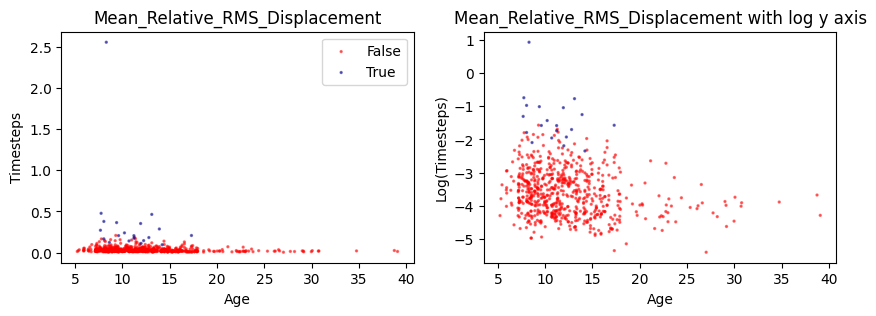

In [19]:
scatter_motion('Mean_Relative_RMS_Displacement',cats_by = "Exclude");

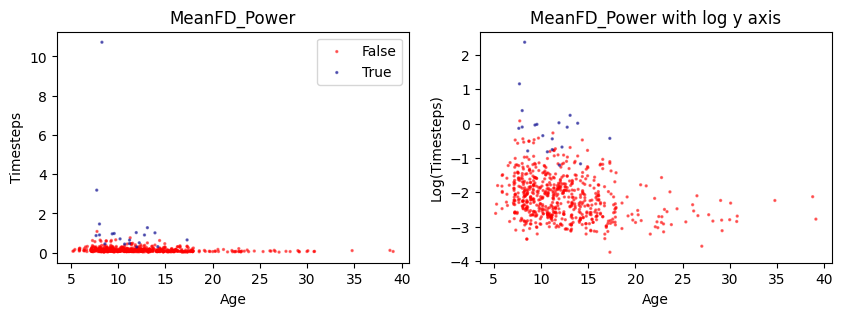

In [20]:
scatter_motion('MeanFD_Power',cats_by = "Exclude")

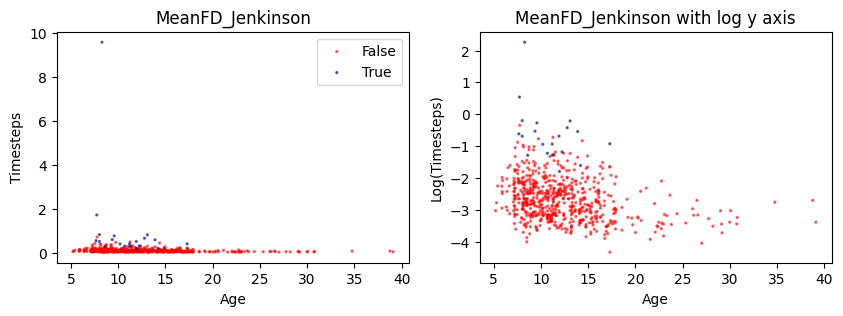

In [21]:
scatter_motion('MeanFD_Jenkinson',cats_by = "Exclude")

In [22]:
def scatter_motion_paper_format(col_name:str = 'Mean_Relative_RMS_Displacement',cats_by = "Label", y_lab = "",title_str= "",colours = sns.color_palette(),labels = []): 
    #colours = ["red","darkblue","limegreen","violet","purple","black","gold","orange"]
    category_mapping = {category: colours[idx] for idx, category in enumerate(np.unique(motion_lab_df[cats_by]))}
    fig, (ax2) = plt.subplots(1,1,figsize=(9, 3))
    for label in np.unique(motion_lab_df[cats_by]):
        category_numbers = [category_mapping[cat] for cat in  motion_lab_df[cats_by][motion_lab_df[cats_by]==label]]
        ax2.scatter(motion_lab_df["Age"][motion_lab_df[cats_by]==label],np.log(motion_lab_df[col_name][motion_lab_df[cats_by]==label]),s=50,alpha = 0.8,c = category_numbers,label=label,marker = ".",edgecolors='none')

    ax2.legend(title=cats_by, labels=labels,markerscale=2)  

    ax2.set_xlabel("Age")
    ax2.set_ylabel(y_lab)


    ax2.set_title(title_str)  
    #ax2.set_title(col_name+" with log y axis")  


    fig.show()
    return fig


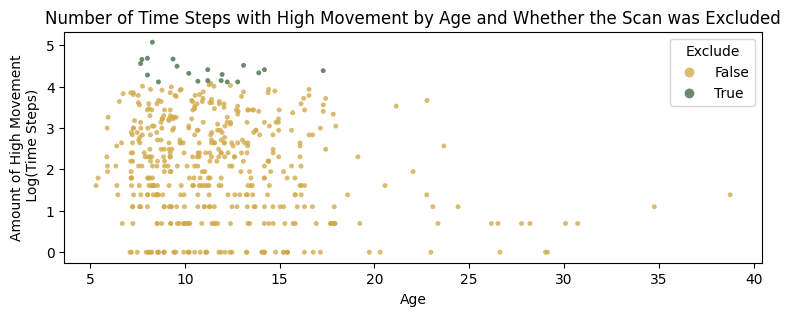

In [23]:
fig = scatter_motion_paper_format('Movements_gt_threshold',cats_by = "Exclude",y_lab="Amount of High Movement\n Log(Time Steps)",title_str="Number of Time Steps with High Movement by Age and Whether the Scan was Excluded",
                                  colours=["#d2aa4b","#466e4b"],
                                  labels=["False","True"])
plt.savefig("../pics/HeadMovement/Threshold_Disp.svg", bbox_inches="tight")


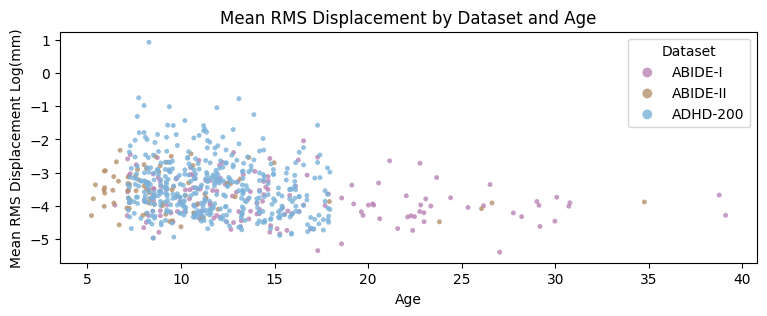

In [24]:
fig = scatter_motion_paper_format('Mean_Relative_RMS_Displacement',cats_by="Dataset",y_lab="Mean RMS Displacement Log(mm)",title_str="Mean RMS Displacement by Dataset and Age",
                                  colours=["#BA83B6","#B6906A","#7BB2DA"],
                                  labels=["ABIDE-I","ABIDE-II","ADHD-200"])
plt.savefig("../pics/HeadMovement/RMS_Disp.svg", bbox_inches="tight")


#### Plot All Head Motion Statistics

Overall there was more head motion in younger people, as expected.

It can also be seen that the ADHD 200 data is lower quality in terms of head motion statistics than ABIDE (I and II)

##### by Diagnosis

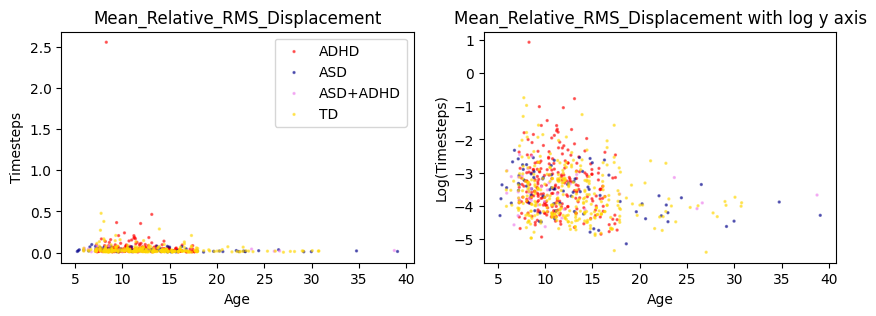

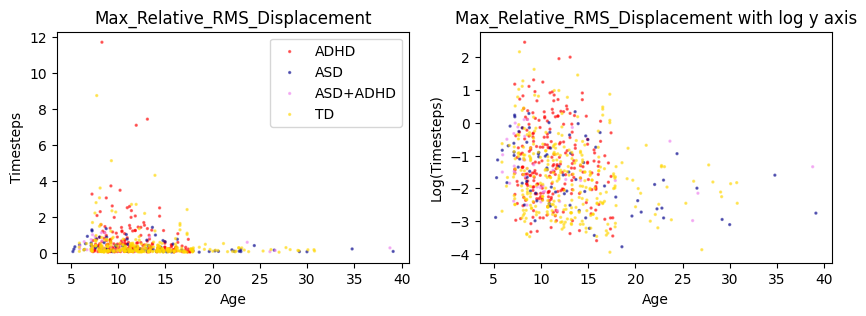

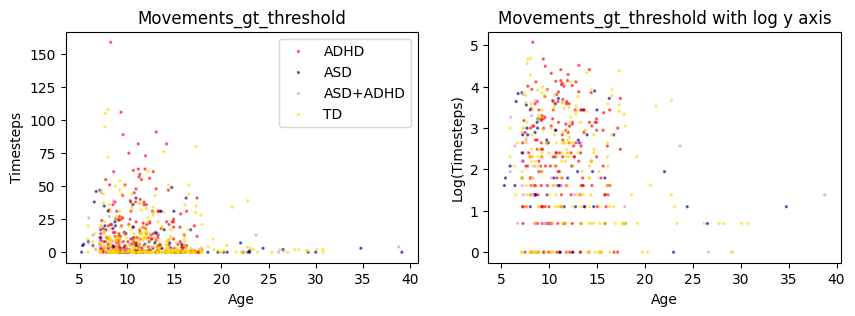

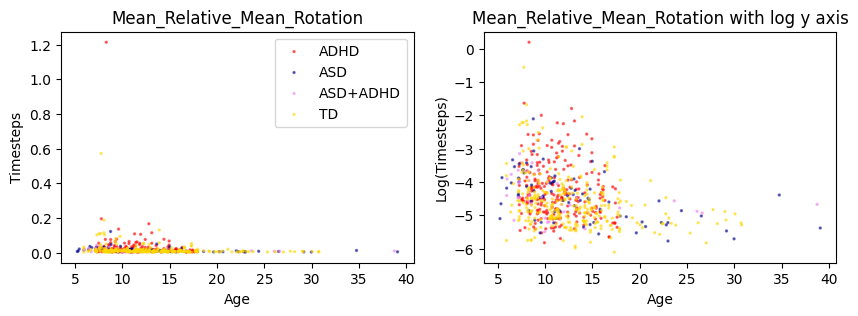

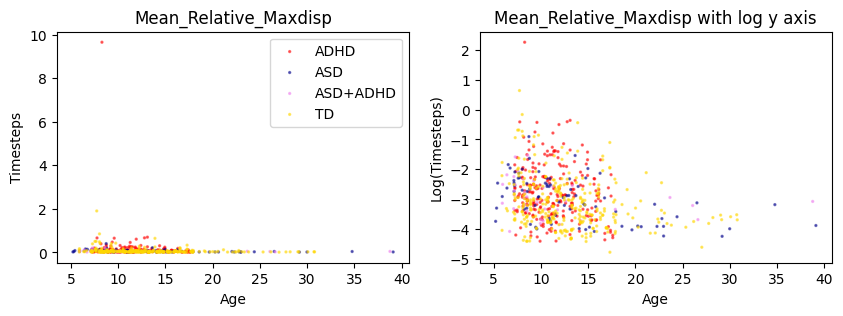

...

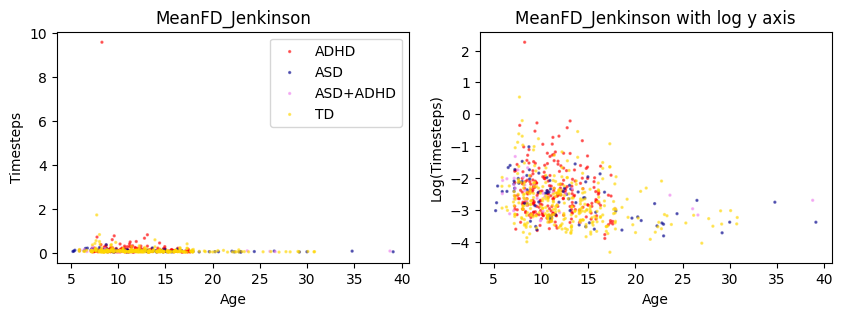

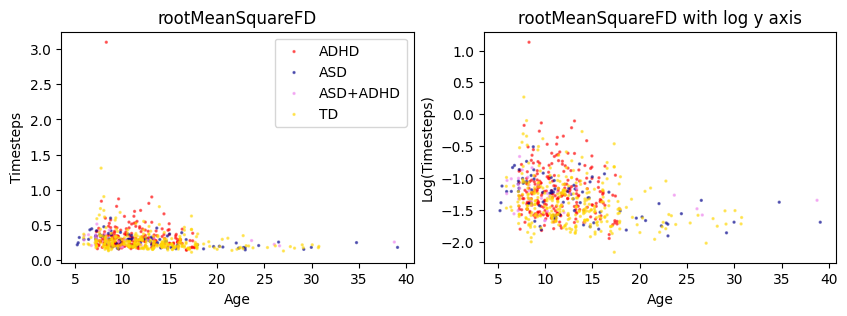

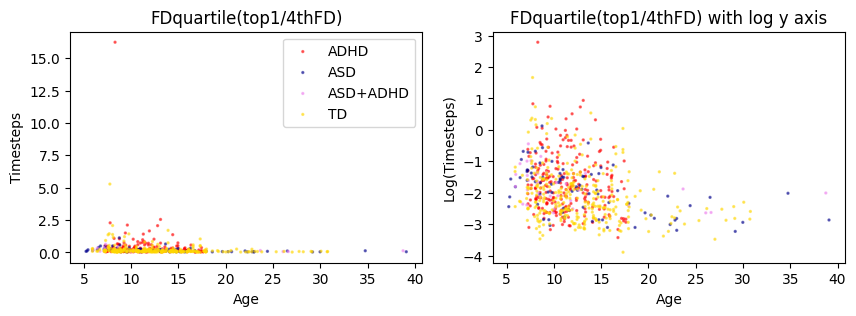

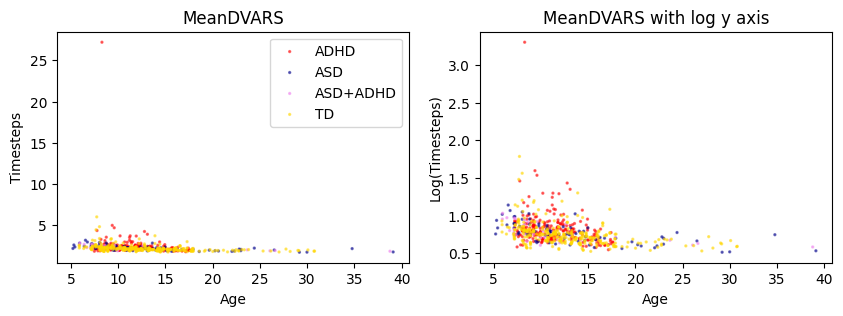

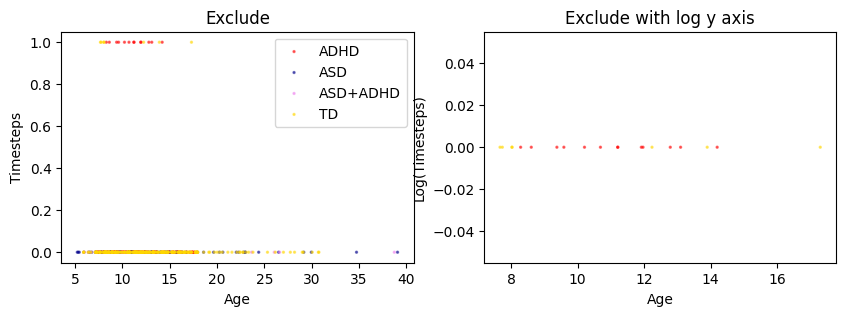

In [25]:
for column in motion_df.columns[3:]:
    scatter_motion(column)

##### by Dataset

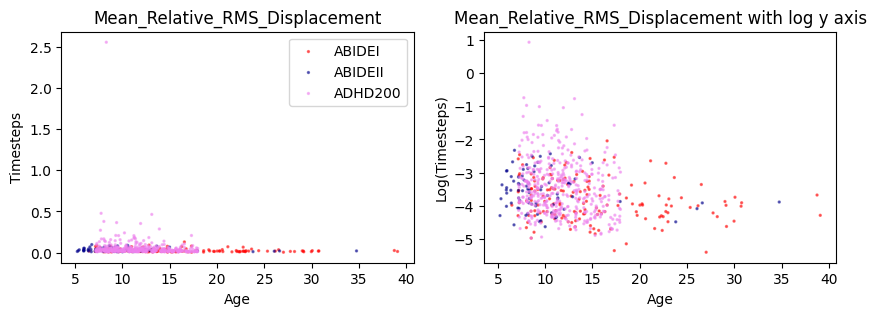

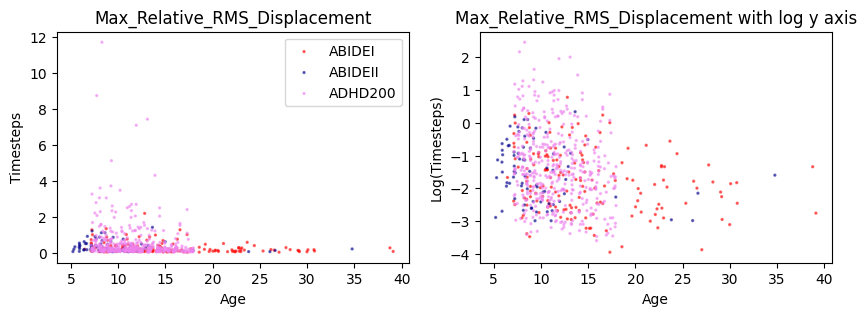

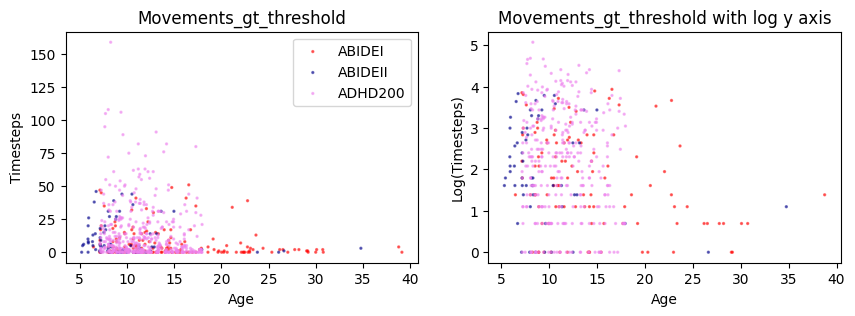

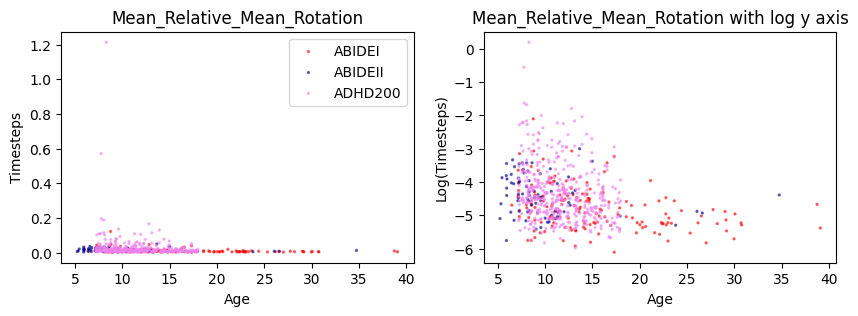

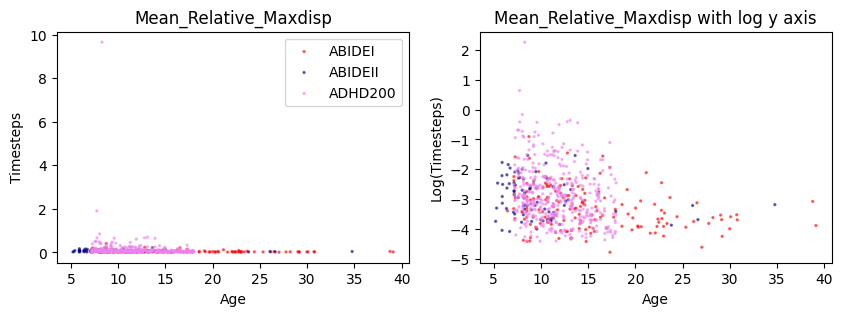

...

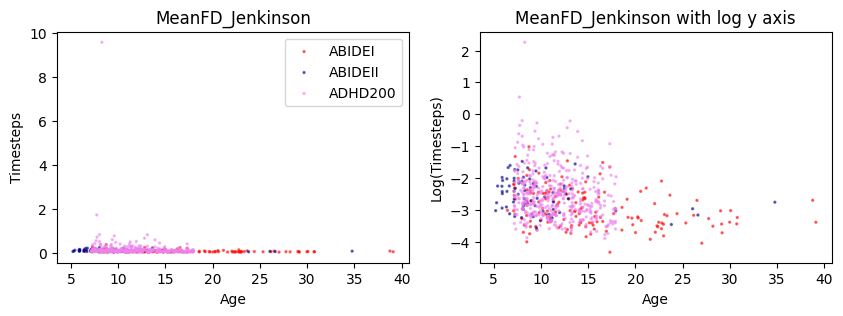

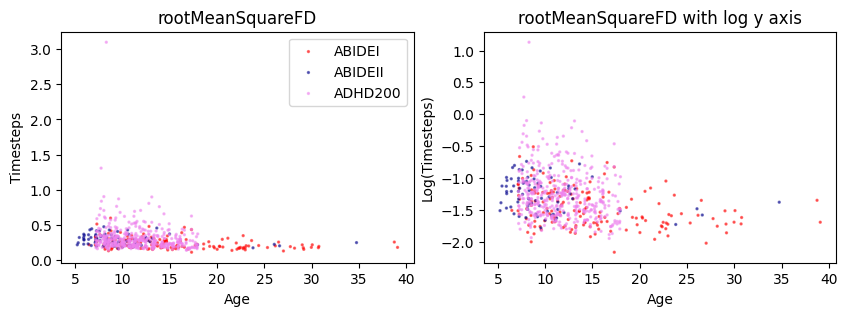

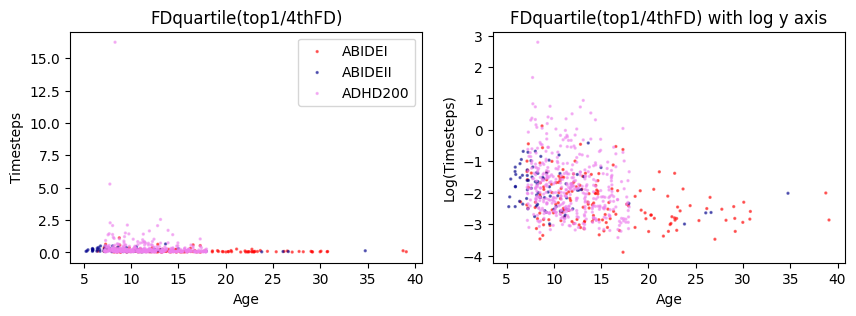

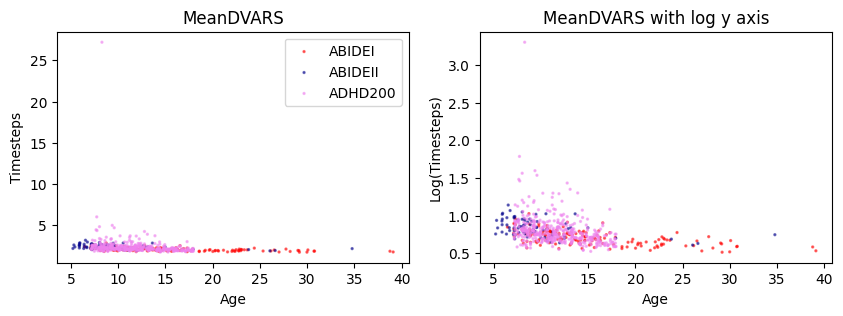

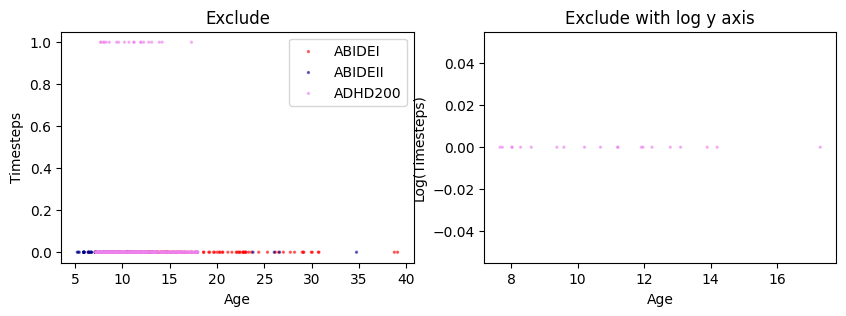

In [26]:
for column in motion_df.columns[3:]:
    scatter_motion(column,cats_by="Dataset")

##### by Detailed Diagnosis

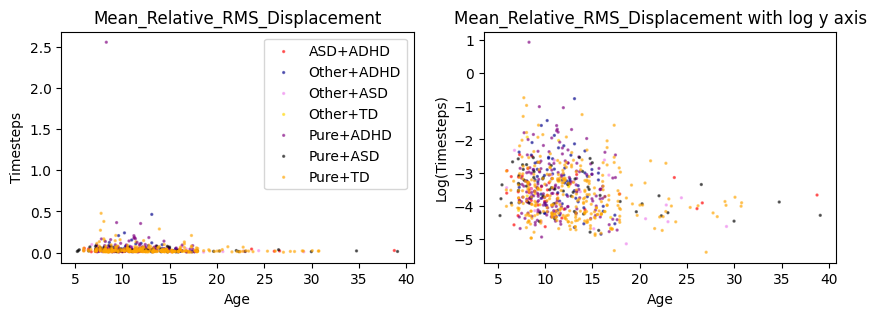

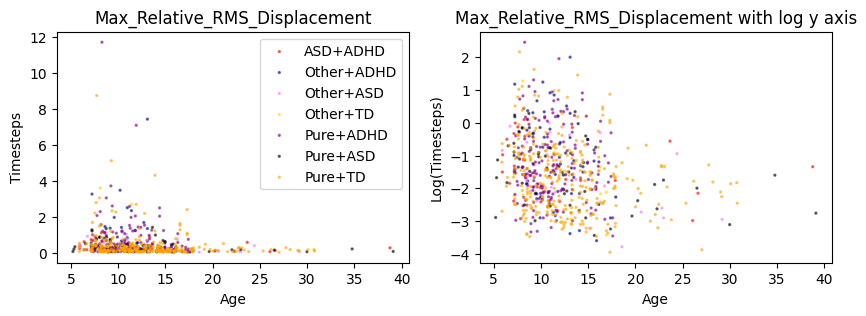

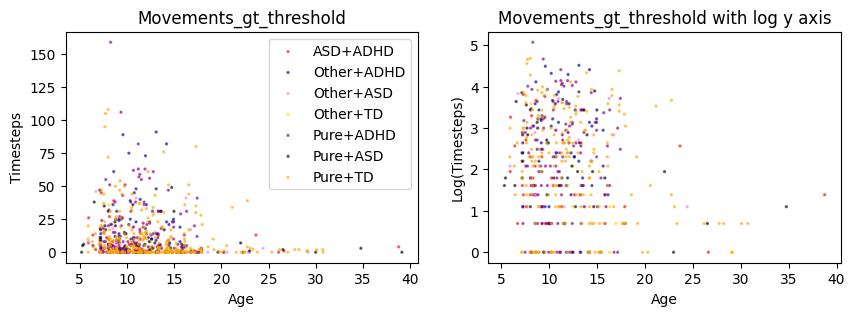

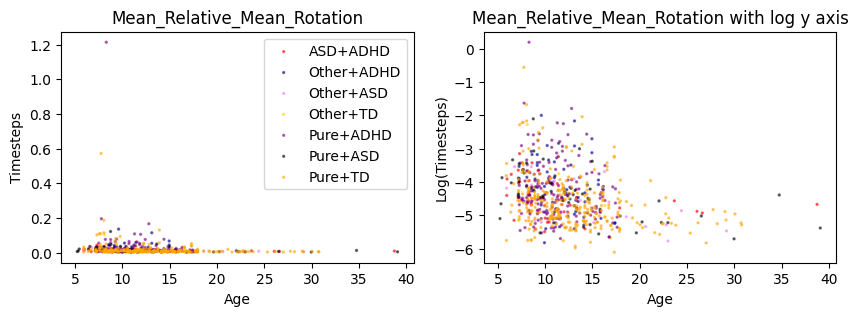

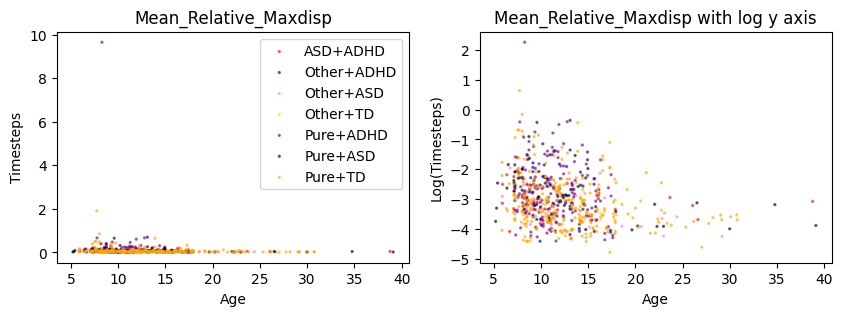

...

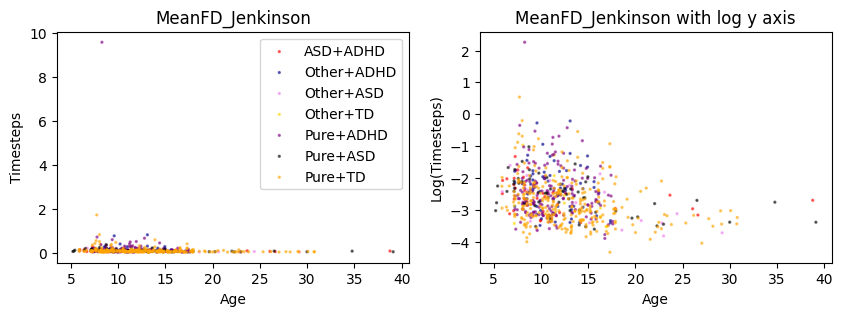

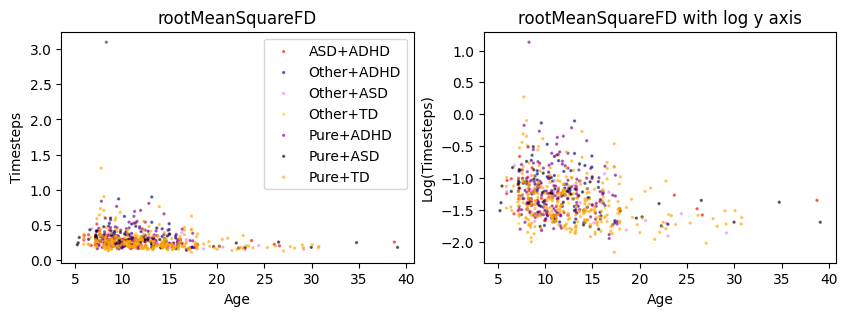

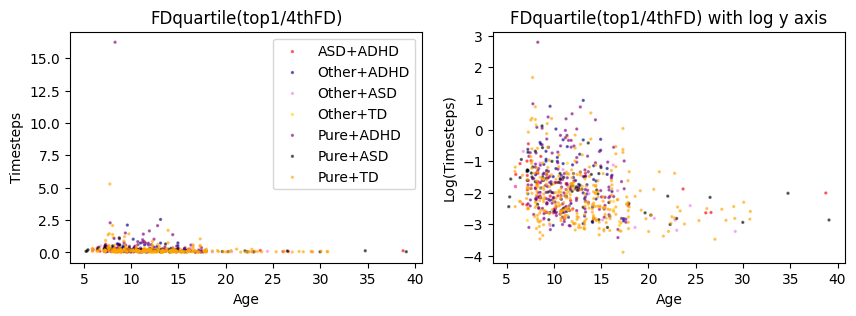

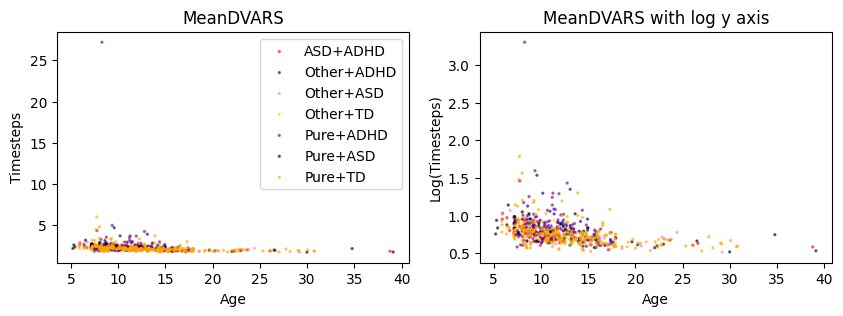

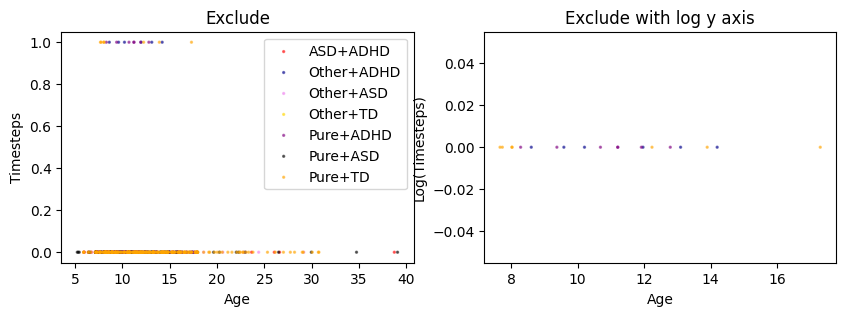

In [27]:
for column in motion_df.columns[3:]:
    scatter_motion(column,cats_by="Detailed_Label")

##### by Sex

In [28]:
motion_lab_df["Sex"] = motion_lab_df["Sex"].fillna("None")

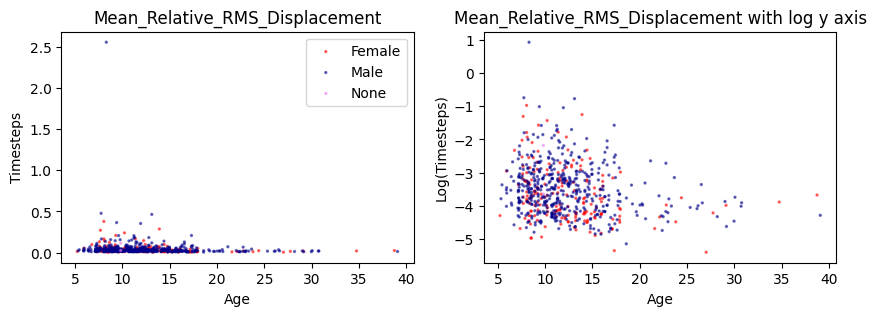

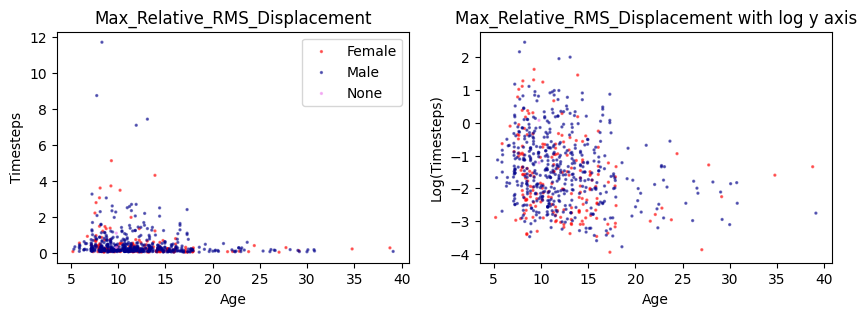

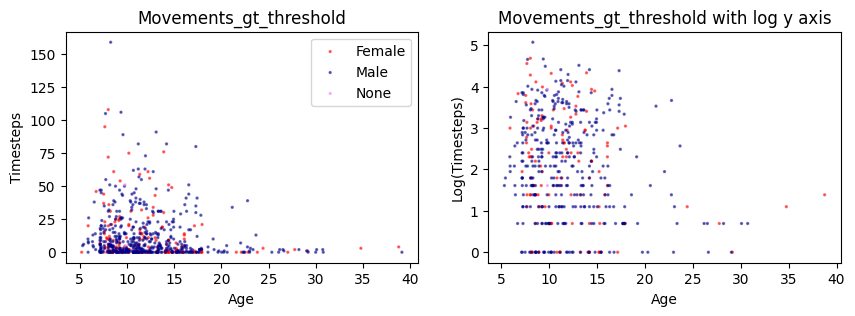

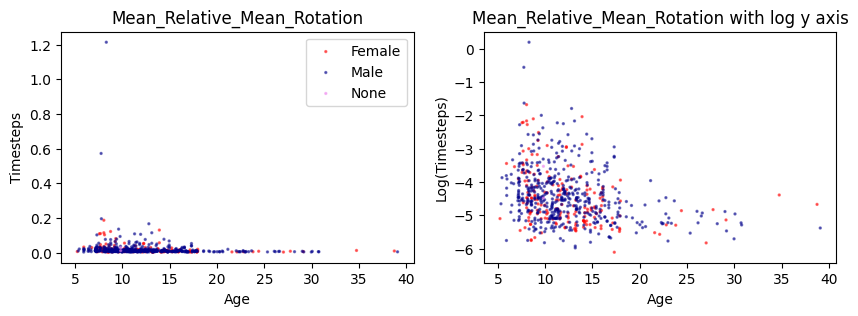

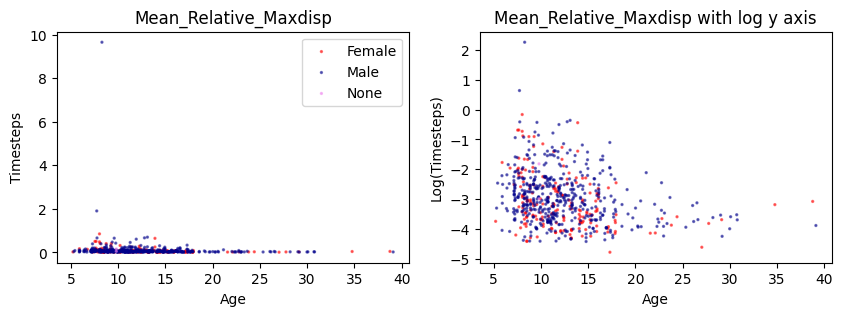

...

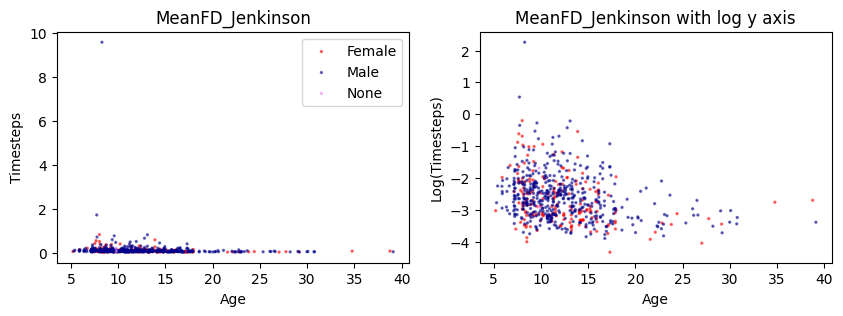

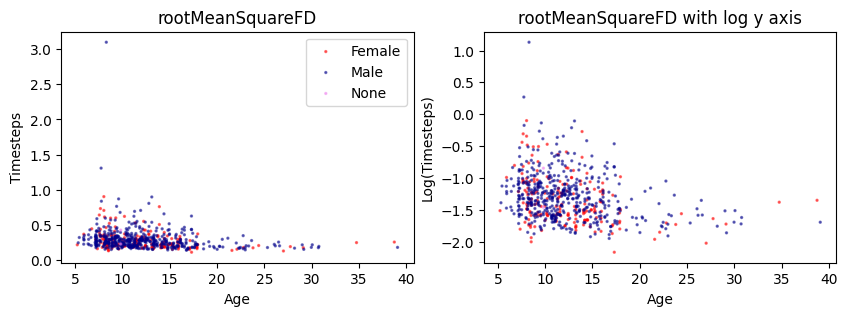

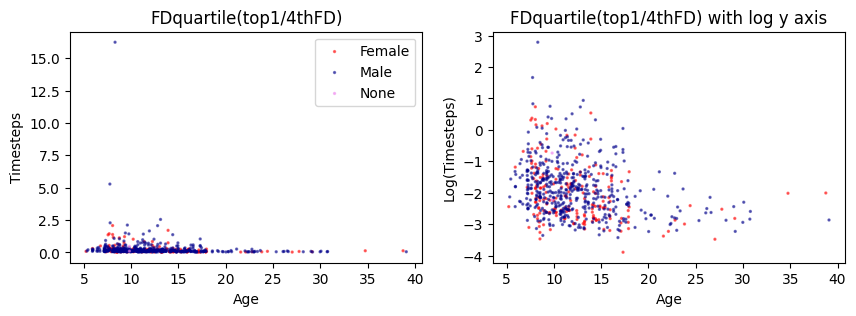

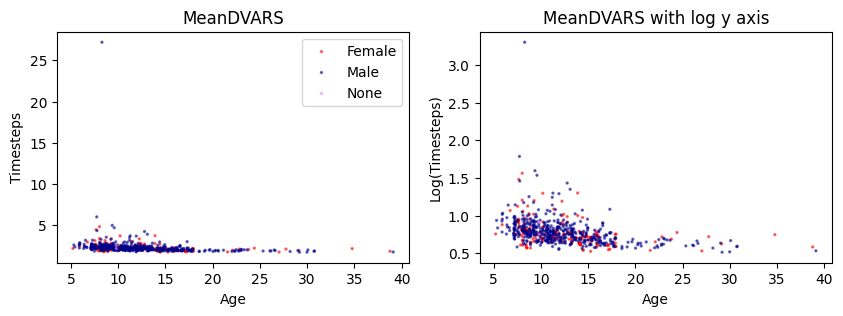

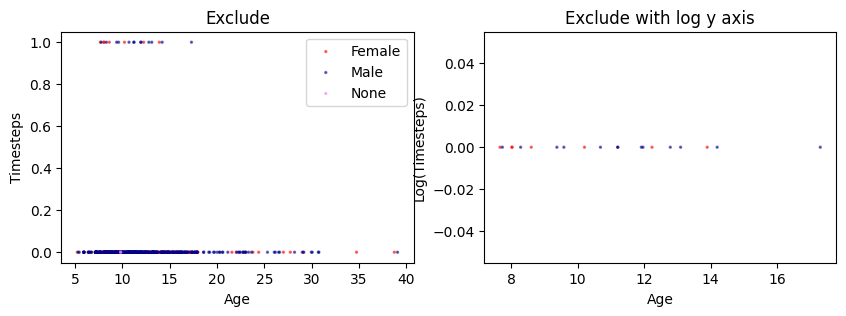

In [29]:
for column in motion_df.columns[3:]:
    scatter_motion(column,cats_by="Sex")

### Summary Statistics

In [30]:
motion_lab_df.groupby(by="Sex").mean(numeric_only=True) 

,Sub ID,Age,IQ,Mean_Relative_RMS_Displacement,Max_Relative_RMS_Displacement,Movements_gt_threshold,Mean_Relative_Mean_Rotation,Mean_Relative_Maxdisp,Max_Relative_Maxdisp,Max_Abs_Maxdisp,...,Mean_Abs_dS-I,Mean_Abs_dL-R,Mean_Abs_dP-A,MeanFD_Power,MeanFD_Jenkinson,rootMeanSquareFD,FDquartile(top1/4thFD),MeanDVARS,Exclude,Scans
Sex,,,,,,,,,,,,,,,,,,,,,
Female,1243256.0,12.397718,108.306818,0.038355,0.409088,10.845745,0.017739,0.076292,0.961915,1.798649,...,0.139414,0.045233,0.074951,0.157524,0.093009,0.277801,0.219288,2.191247,0.037234,1.680851
Male,790222.568085,12.277157,109.172113,0.046178,0.490476,12.406383,0.020398,0.100399,1.138983,1.95503,...,0.171572,0.055455,0.092003,0.188235,0.119618,0.296284,0.271439,2.271322,0.02766,1.451064
None,10044.0,9.81,108.0,0.069452,0.688549,28.0,0.020374,0.106406,0.9175,1.9645,...,0.429762,0.04752,0.137084,0.204627,0.118601,0.330057,0.29287,2.308001,0.0,2.000000


In [31]:
motion_lab_df.groupby(by="Label").mean(numeric_only=True)

,Sub ID,Age,IQ,Mean_Relative_RMS_Displacement,Max_Relative_RMS_Displacement,Movements_gt_threshold,Mean_Relative_Mean_Rotation,Mean_Relative_Maxdisp,Max_Relative_Maxdisp,Max_Abs_Maxdisp,...,Mean_Abs_dS-I,Mean_Abs_dL-R,Mean_Abs_dP-A,MeanFD_Power,MeanFD_Jenkinson,rootMeanSquareFD,FDquartile(top1/4thFD),MeanDVARS,Exclude,Scans
Label,,,,,,,,,,,,,,,,,,,,,
ADHD,1396703.468354,11.331561,106.209607,0.059268,0.626504,15.738397,0.025949,0.13584,1.439219,2.36573,...,0.194208,0.055414,0.094438,0.236505,0.156642,0.326645,0.356982,2.406251,0.054852,1.776371
ASD,44455.5625,13.348575,103.9,0.033088,0.340119,10.45,0.01564,0.065719,0.905237,1.586275,...,0.147898,0.049458,0.08242,0.144305,0.085922,0.279463,0.191479,2.180807,0.0,1.000000
ASD+ADHD,37444.891892,11.370054,110.555556,0.031193,0.341391,8.135135,0.014436,0.063244,0.877162,1.488622,...,0.130356,0.058799,0.066071,0.140953,0.086785,0.285589,0.185291,2.234971,0.0,1.000000
TD,879726.127451,12.897049,112.239726,0.036619,0.393748,9.996732,0.016429,0.071738,0.88898,1.693725,...,0.147143,0.050317,0.085576,0.14929,0.087367,0.267325,0.204605,2.14592,0.022876,1.516340


In [32]:
motion_lab_df.groupby(by="Detailed_Label").mean(numeric_only=True)

,Sub ID,Age,IQ,Mean_Relative_RMS_Displacement,Max_Relative_RMS_Displacement,Movements_gt_threshold,Mean_Relative_Mean_Rotation,Mean_Relative_Maxdisp,Max_Relative_Maxdisp,Max_Abs_Maxdisp,...,Mean_Abs_dS-I,Mean_Abs_dL-R,Mean_Abs_dP-A,MeanFD_Power,MeanFD_Jenkinson,rootMeanSquareFD,FDquartile(top1/4thFD),MeanDVARS,Exclude,Scans
Detailed_Label,,,,,,,,,,,,,,,,,,,,,
ASD+ADHD,37444.891892,11.370054,110.555556,0.031193,0.341391,8.135135,0.014436,0.063244,0.877162,1.488622,...,0.130356,0.058799,0.066071,0.140953,0.086785,0.285589,0.185291,2.234971,0.0,1.000000
Other+ADHD,2078993.861111,11.597361,104.157143,0.054651,0.668398,18.208333,0.021493,0.102231,1.352222,2.367319,...,0.193326,0.062069,0.094486,0.210427,0.127387,0.32984,0.310332,2.335235,0.083333,1.861111
Other+ASD,49098.73913,14.146957,109.347826,0.031204,0.318191,9.956522,0.012445,0.051773,0.54587,1.242391,...,0.127404,0.060061,0.065887,0.125547,0.072082,0.254991,0.152192,2.109247,0.0,1.000000
Other+TD,1557376.5,12.073333,114.666667,0.042081,0.666724,9.666667,0.020358,0.086341,1.270667,2.076,...,0.127737,0.05562,0.118491,0.170139,0.102793,0.28938,0.263415,2.110854,0.0,2.000000
Pure+ADHD,1098976.751515,11.215576,107.113208,0.061283,0.608223,14.660606,0.027894,0.150506,1.477182,2.365036,...,0.194593,0.05251,0.094418,0.247885,0.169408,0.325251,0.377339,2.437241,0.042424,1.739394
Pure+ASD,42582.0,13.026421,101.701754,0.033848,0.348967,10.649123,0.01693,0.071347,1.050246,1.725035,...,0.156168,0.04518,0.089091,0.151874,0.091506,0.289338,0.207332,2.209682,0.0,1.000000
Pure+TD,852066.928571,12.93067,112.135714,0.036397,0.382606,10.010204,0.016269,0.071142,0.873401,1.678122,...,0.147935,0.050101,0.084233,0.148439,0.086737,0.266424,0.202205,2.147352,0.02381,1.496599


In [33]:
motion_lab_df.groupby(by="Dataset").mean(numeric_only=True)

,Sub ID,Age,IQ,Mean_Relative_RMS_Displacement,Max_Relative_RMS_Displacement,Movements_gt_threshold,Mean_Relative_Mean_Rotation,Mean_Relative_Maxdisp,Max_Relative_Maxdisp,Max_Abs_Maxdisp,...,Mean_Abs_dS-I,Mean_Abs_dL-R,Mean_Abs_dP-A,MeanFD_Power,MeanFD_Jenkinson,rootMeanSquareFD,FDquartile(top1/4thFD),MeanDVARS,Exclude,Scans
Dataset,,,,,,,,,,,,,,,,,,,,,
ABIDEI,51050.329268,15.056409,111.04878,0.027079,0.26475,7.04878,0.010968,0.048241,0.594579,1.264835,...,0.133924,0.055799,0.080066,0.110262,0.063078,0.238774,0.138089,2.039024,0.0,1.000000
ABIDEII,29215.428571,9.836416,107.065789,0.0337,0.33302,10.077922,0.014855,0.066245,0.80961,1.443364,...,0.145884,0.043285,0.068201,0.147421,0.090985,0.29197,0.192007,2.33167,0.0,1.000000
ADHD200,1418937.902148,11.680191,108.410579,0.052547,0.57219,14.305489,0.023914,0.116303,1.332091,2.249086,...,0.177832,0.052932,0.093614,0.212553,0.135066,0.311454,0.314933,2.315401,0.047733,1.816229
